# Brief Project Description:

The data set I'll be working with is a huge dataset of every pitch thrown over the course of 4 years (2015-2018) found here: https://www.kaggle.com/pschale/mlb-pitch-data-20152018. In this project I first trim some of the outlying rare pitch data out so that we can focus on 9 different types of pitches. Some of these pitches are highly similar to others (four seam fastball and two seam fastball). I was curious which dimensionality reducation technique and clustering pair would perform the best in terms of figuring out the different types of pitches. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import umap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
import warnings

warnings.filterwarnings('ignore')

df = pd.read_csv(r'/Users/steveangeli/Desktop/Thinkful Data Science Projects/Unsupervised Learning Challenge/pitches.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.head()

,px,pz,start_speed,end_speed,spin_rate,spin_dir,break_angle,break_length,break_y,ax,ay,az,sz_bot,sz_top,type_confidence,vx0,vy0,vz0,x,x0,y,y0,z0,pfx_x,pfx_z,nasty,zone,code,type,pitch_type,event_num,b_score,ab_id,b_count,s_count,outs,pitch_num,on_1b,on_2b,on_3b
0,0.416,2.963,92.9,84.1,2305.052,159.235,-25.0,3.2,23.7,7.665,34.685,-11.960,1.72,3.56,2.0,-6.409,-136.065,-3.995,101.140000,2.280,158.780000,50.0,5.302,4.16,10.93,55.0,3.0,C,S,FF,3,0.0,2.015000e+09,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,-0.191,2.347,92.8,84.1,2689.935,151.402,-40.7,3.4,23.7,12.043,34.225,-10.085,1.72,3.56,2.0,-8.411,-135.690,-5.980,124.280000,2.119,175.410000,50.0,5.307,6.57,12.00,31.0,5.0,S,S,FF,4,0.0,2.015000e+09,0.0,1.0,0.0,2.0,0.0,0.0,0.0
2,-0.518,3.284,94.1,85.2,2647.972,145.125,-43.7,3.7,23.7,14.368,35.276,-11.560,1.72,3.56,2.0,-9.802,-137.668,-3.337,136.740000,2.127,150.110000,50.0,5.313,7.61,10.88,49.0,1.0,F,S,FF,5,0.0,2.015000e+09,0.0,2.0,0.0,3.0,0.0,0.0,0.0
3,-0.641,1.221,91.0,84.0,1289.590,169.751,-1.3,5.0,23.8,2.104,28.354,-20.540,1.74,3.35,2.0,-8.071,-133.005,-6.567,109.685636,2.279,187.463482,50.0,5.210,1.17,6.45,41.0,13.0,B,B,FF,6,0.0,2.015000e+09,0.0,2.0,0.0,4.0,0.0,0.0,0.0
4,-1.821,2.083,75.4,69.6,1374.569,280.671,18.4,12.0,23.8,-10.280,21.774,-34.111,1.72,3.56,2.0,-6.309,-110.409,0.325,146.527525,2.179,177.242829,50.0,5.557,-8.43,-1.65,18.0,13.0,B,B,CU,7,0.0,2.015000e+09,1.0,2.0,0.0,5.0,0.0,0.0,0.0


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2867154 entries, 0 to 2867153
Data columns (total 40 columns):
px                 float64
pz                 float64
start_speed        float64
end_speed          float64
spin_rate          float64
spin_dir           float64
break_angle        float64
break_length       float64
break_y            float64
ax                 float64
ay                 float64
az                 float64
sz_bot             float64
sz_top             float64
type_confidence    float64
vx0                float64
vy0                float64
vz0                float64
x                  float64
x0                 float64
y                  float64
y0                 float64
z0                 float64
pfx_x              float64
pfx_z              float64
nasty              float64
zone               float64
code               object
type               object
pitch_type         object
event_num          int64
b_score            float64
ab_id              float64
b

In [3]:
df.isnull().sum()

px                 14189
pz                 14189
start_speed        14114
end_speed          14114
spin_rate          14189
spin_dir           14189
break_angle        14189
break_length       14189
break_y            14189
ax                 14189
ay                 14189
az                 14189
sz_bot              2083
sz_top              2083
type_confidence    14189
vx0                14189
vy0                14189
vz0                14189
x                      0
x0                 14189
y                      0
y0                 14189
z0                 14189
pfx_x              14142
pfx_z              14142
nasty              14189
zone               14189
code                5719
type                   0
pitch_type         14189
event_num              0
b_score                0
ab_id                  0
b_count                0
s_count                0
outs                   0
pitch_num              0
on_1b                  0
on_2b                  0
on_3b                  0


In [4]:
df = df.dropna()

In [5]:
df.pitch_type.value_counts()

FF    1012917
SL     449804
FT     337244
CH     292123
SI     242047
CU     233913
FC     149376
KC      66410
FS      43533
KN      11260
IN       6187
EP        812
FO        810
PO        626
SC        113
UN         57
AB          9
FA          9
Name: pitch_type, dtype: int64

Cut down the number of "types" to the most common 9.

In [6]:
pitches = ['FF', 'SL', 'FT', 'CH', 'SI', 'CU', 'FC', 'KC', 'FS']
df = df[df.pitch_type.isin(pitches)]
df.pitch_type.value_counts()

FF    1012917
SL     449804
FT     337244
CH     292123
SI     242047
CU     233913
FC     149376
KC      66410
FS      43533
Name: pitch_type, dtype: int64

FF - Four-seam Fastball
SL - Slider
FT - Two-seam Fastball
CH - Changeup
SI - Sinker
CU - Curveball
FC - Cutter
KC - Knuckle curve
FS - Splitter

In [7]:
# Label encode target variable
le = LabelEncoder()
le.fit(df.pitch_type)
df.pitch_type = le.transform(df.pitch_type)

In [8]:
# Drop categorical-like features or data that I don't know what it means. 

df.drop(['code', 'type', 'b_count', 's_count', 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b', 'ab_id', 'event_num', 'b_score', 'px', 'pz', 'type_confidence', 'nasty', 'zone', 'ax', 'ay', 'az', 'sz_bot', 'sz_top', 'vx0', 'vy0', 'vz0', 'x', 'x0', 'y', 'y0', 'z0', 'pfx_x', 'pfx_z'], axis=1, inplace=True)

In [9]:
df.shape

(2827367, 8)

In [10]:
X = df.sample(n=10000, replace=False, random_state=13, axis=0)

In [11]:
X.pitch_type.value_counts()

3    3540
8    1662
5    1188
0    1016
7     892
1     794
2     562
6     209
4     137
Name: pitch_type, dtype: int64

In [12]:
X = X.reset_index(drop=True)
y = X['pitch_type']
X = X.drop('pitch_type', axis=1)

# Dimensionality Reduction

### UMAP

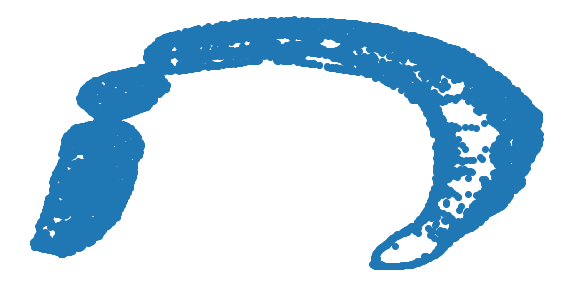

In [13]:
umap_ = umap.UMAP(n_neighbors=100, min_dist=0.3, metric='euclidean')
umap_results = umap_.fit_transform(X)

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(umap_results.shape[0]):
#     plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

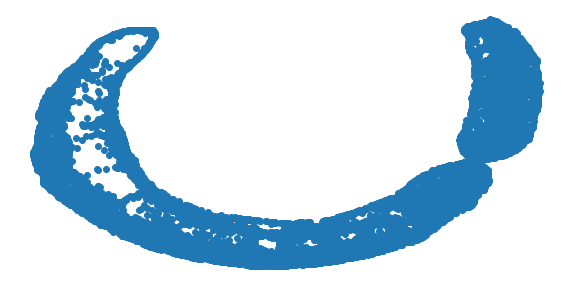

In [14]:
umap_ = umap.UMAP(n_neighbors=500, min_dist=0.3, metric='euclidean')
umap_results = umap_.fit_transform(X)

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(umap_results.shape[0]):
#     plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

### T-SNE

In [15]:
# Standarizing the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

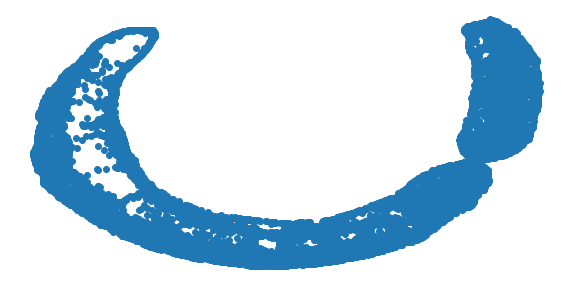

In [16]:
tsne = TSNE(n_components=2, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(tsne_results.shape[0]):
#     plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

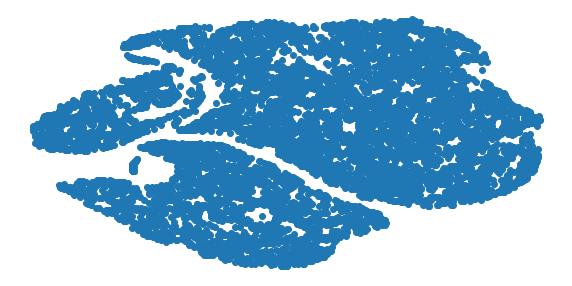

In [17]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(tsne_results.shape[0]):
#     plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

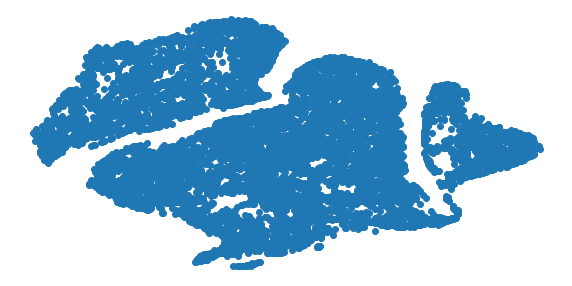

In [18]:
tsne = TSNE(n_components=2, perplexity=50, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(tsne_results.shape[0]):
#     plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

### PCA

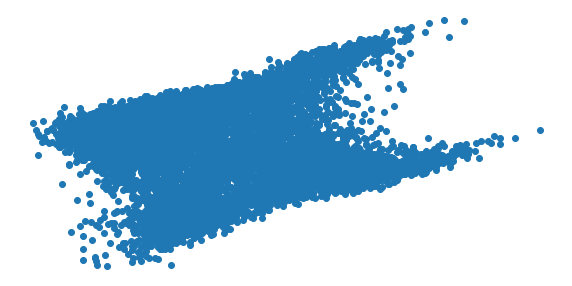

In [19]:
pca = PCA(n_components=2)

pca_components = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# plt.figure(figsize=(10,5))
# colors = ["r","b","g","c","m","y","k","r","burlywood"]
# for i in range(pca_components.shape[0]):
#     plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
#              color=colors[int(y[i])],
#              fontdict={'weight': 'bold', 'size': 50}
#         )

# plt.xticks([])
# plt.yticks([])
# plt.axis('off')
# plt.show()

Without coloring it appears that t-SNE is separating the pitches into 3 groups and that PCA isn't doing much. But with the coloring on the groupings that are forming under t-SNE are a mix of completely different pitches whereas with PCA similar pitches are much better grouped together. This is a good example of how potentially mixleading these visualizations can be. 

# Clustering

### Gaussian Mixture

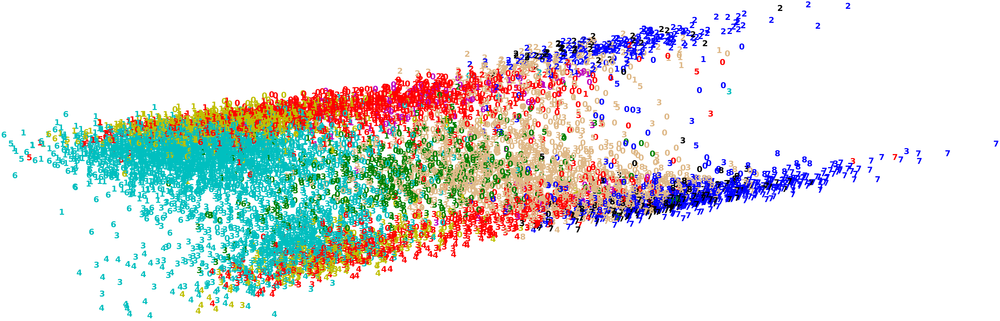

Adjusted Rand Index of the GMM Clustering solution for 9 clusters: 0.10699704260114716
The silhouette score of the GMM Clustering solution for 9 clusters: 0.14834700380988902


In [20]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=9, random_state=13)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the GMM Clustering solution for 9 clusters: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the GMM Clustering solution for 9 clusters: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

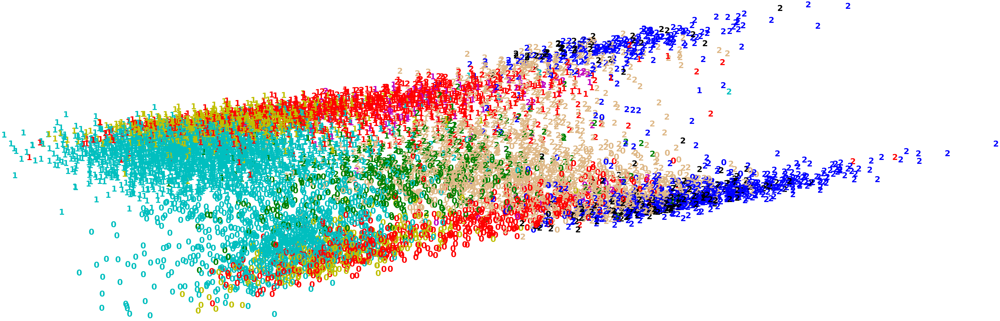

Adjusted Rand Index of the GMM Clustering solution for 3 clusters: 0.20200934835223147
The silhouette score of the GMM Clustering solution for 3 clusters: 0.2636849243231203


In [21]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=3, random_state=13)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the GMM Clustering solution for 3 clusters: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the GMM Clustering solution for 3 clusters: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

### DBSCAN

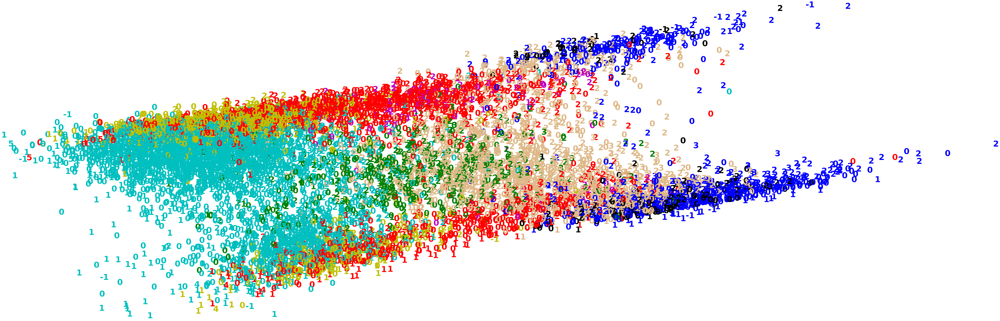

Adjusted Rand Index of the DBSCAN Clustering solution: 0.04166334201736568
The silhouette score of the DBSCAN Clustering solution: 0.04046515637275828


In [22]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1.5, min_samples=10)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the DBSCAN Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the DBSCAN Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

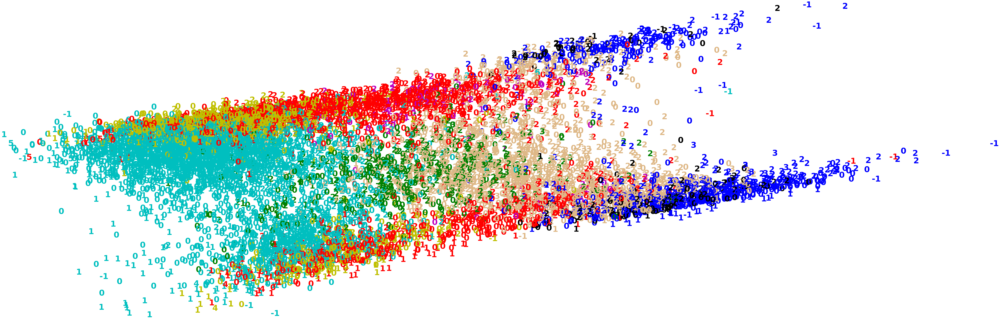

Adjusted Rand Index of the DBSCAN Clustering solution: 0.0418794871798173
The silhouette score of the DBSCAN Clustering solution: 0.006501964407438416


In [23]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the DBSCAN Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the DBSCAN Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

### Agglomerative Clustering

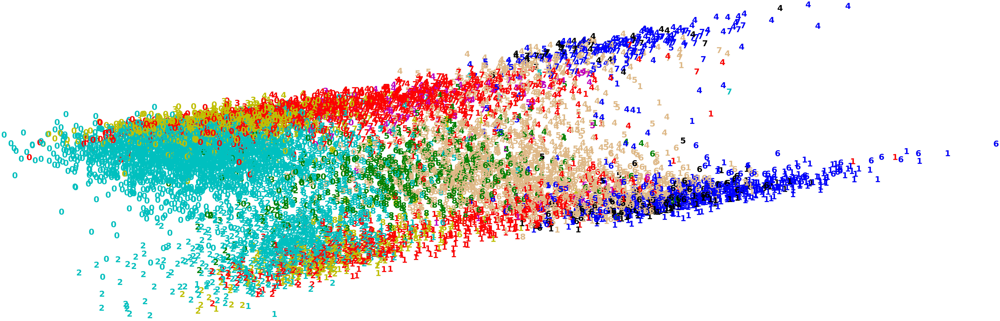

Adjusted Rand Index of the Agglomerative Clustering solution: 0.24397987044685332
The silhouette score of the Agglomerative Clustering solution: 0.2037218228366149


In [24]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=9)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

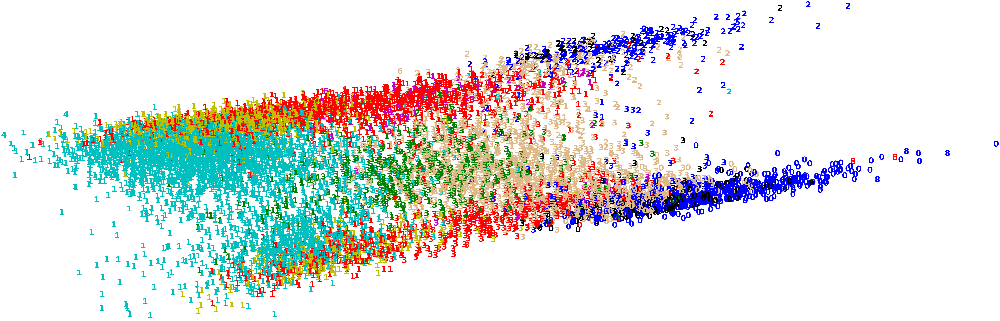

Adjusted Rand Index of the Agglomerative Clustering solution: 0.29287612242054867
The silhouette score of the Agglomerative Clustering solution: 0.14125862465890734


In [25]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='euclidean',
                                      n_clusters=9)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

### K-Means

946 ms ± 126 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


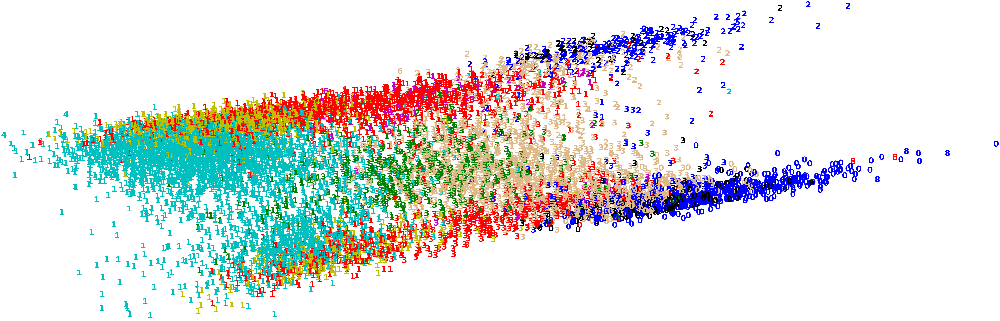

Adjusted Rand Index of the K-Means Clustering solution for 9 clusters: 0.22745424366609798
The silhouette score of the K-Means Clustering solution for 9 clusters: 0.29710989269297233


In [26]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=9, random_state=13)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the K-Means Clustering solution for 9 clusters: {}"
      .format(metrics.adjusted_rand_score(y, y_pred)))
print("The silhouette score of the K-Means Clustering solution for 9 clusters: {}"
      .format(metrics.silhouette_score(X_std, y_pred, metric='euclidean')))

189 ms ± 5.12 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


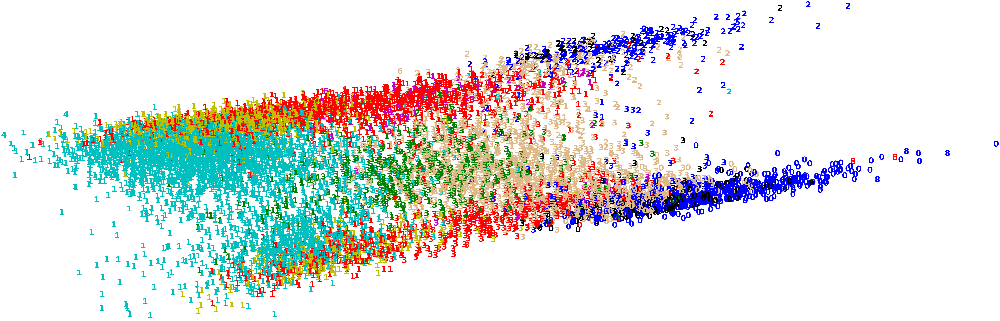

Adjusted Rand Index of the K-Means Clustering solution for 3 clusters: 0.24297155101411938
The silhouette score of the K-Means Clustering solution for 3 clusters: 0.30536349132578244


In [27]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=3, random_state=13)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colors = ["r","b","g","c","m","y","k","r","burlywood"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(clusters[i]),
             color=colors[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Adjusted Rand Index of the K-Means Clustering solution for 3 clusters: {}"
      .format(metrics.adjusted_rand_score(y, y_pred)))
print("The silhouette score of the K-Means Clustering solution for 3 clusters: {}"
      .format(metrics.silhouette_score(X_std, y_pred, metric='euclidean')))

# Clustering:

Based on the ARI and silhouette scores K-means performed the best with GMM being a close second. I tested out clusters of 3 and 9 and there was slight improvement with 3 clusters. This tells me that there may be groups of pitches, like all the fastballs are a group, all the slower pitches are a group, and all the pitches in between or are a mix of those two pitch types are a group. 